In [1]:
%load_ext autoreload 
%autoreload 2

# Example notebook for DIP ptycho of the MOSS-6 dataset 

To be used with the `diffractive_imaging` branch of quantEM. 

[Data available](https://zenodo.org/records/13958144) from the [paper](https://www.nature.com/articles/s41467-025-56215-z#data-availability). 

Arthur McCray  
Last remembered to update this line: 9/14/25

In [2]:
from pathlib import Path

import numpy as np
import torch

from quantem.core import config
from quantem.core.datastructures import Dataset4dstem
from quantem.core.visualization import show_2d
from quantem.diffractive_imaging.dataset_models import PtychographyDatasetRaster
from quantem.diffractive_imaging.detector_models import DetectorPixelated
from quantem.diffractive_imaging.object_models import ObjectDIP, ObjectPixelated
from quantem.diffractive_imaging.probe_models import ProbePixelated
from quantem.diffractive_imaging.ptychography import Ptychography
from quantem.core.utils.utils import fit_probe_circle

GPU_ID = 0
config.set_device(GPU_ID)
print(f"device set to {config.get("device")}")


/home/amccray/code/quantem/.venv/lib/python3.12/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


device set to cuda:0


In [3]:
import os 

## from ptyrad 
def load_raw(file_path, shape, dtype=np.float32, offset=0, gap=1024):
    # shape = (N, height, width)
    # np.fromfile with custom dtype is faster than the np.read and np.frombuffer
    # This implementaiton is also roughly 2x faster (10sec vs 20sec) than load_hdf5 with a 128x128x128x128 (1GB) EMPAD dataset
    # Note that for custom processed empad2 raw there might be no gap between the images
    N, height, width = shape

    # Verify file size first
    expected_size = offset + N * (height * width * dtype().itemsize + gap)
    actual_size = os.path.getsize(file_path)

    if actual_size != expected_size:
        raise ValueError(f"Mismatch in expected ({expected_size} bytes = offset + N * (height * width * 4 + gap)) vs. actual ({actual_size} bytes) file size! Check your loading configurations!")
    
    # Define the custom dtype to include both data and gap
    custom_dtype = np.dtype([
        ('data', dtype, (height, width)),
        ('gap', np.uint8, gap)  # uint8 means 1 byte per gap element
    ])

    # Read the entire file using the custom dtype
    with open(file_path, 'rb') as f:
        f.seek(offset)
        raw_data = np.fromfile(f, dtype=custom_dtype, count=N)

    # Extract just the 'data' part (ignoring the gaps)
    data = raw_data['data']
    print("Success! Loaded .raw file path =", file_path)
    print("Imported .raw data shape =", data.shape)
    print("Imported .raw data type =", data.dtype)
    return data
    
    
fdata = Path("~/data/public_ptycho/MOSS6/2025_RawData/ExperimentalData_MOSS-6_Fig.3/scan_x256_y256.raw").expanduser()
data_array = load_raw(fdata, shape=(256*256,128,128), dtype=np.float32)
data_array = data_array.reshape((256,256,128,128))
data_array = np.transpose(data_array, (0,1,3,2))
data_array = data_array.clip(0)


Success! Loaded .raw file path = /home/amccray/data/public_ptycho/MOSS6/2025_RawData/ExperimentalData_MOSS-6_Fig.3/scan_x256_y256.raw
Imported .raw data shape = (65536, 128, 128)
Imported .raw data type = float32


(<Figure size 800x400 with 2 Axes>,
 array([<Axes: title={'center': 'single DP'}>,
        <Axes: title={'center': 'mean DP'}>], dtype=object))

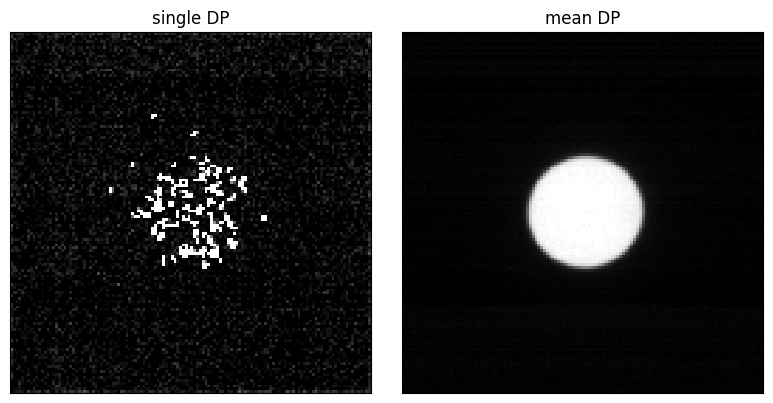

In [4]:
show_2d(
    [
        data_array[0,0],
        data_array.mean((0,1)),
    ],
    titles=[
        "single DP",
        "mean DP",
    ],
)


In [5]:
PROBE_ENERGY = 300e3
PROBE_SEMIANGLE = 10 # mrad 
PROBE_DEFOCUS = 885 # A 
SCAN_STEP_SIZE = 1.051 # A 

NUM_PROBES = 2 
NUM_SLICES = 5 
SLICE_THICKNESS = 40 # A


(<Figure size 400x400 with 1 Axes>, <Axes: title={'center': 'MOSS-6_dp_mean'}>)

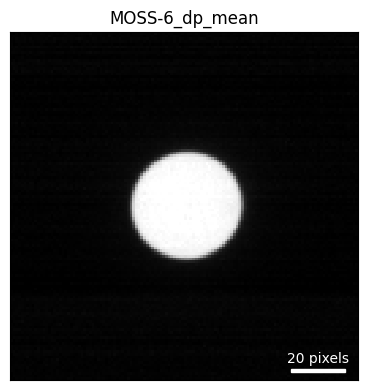

In [6]:
dset = Dataset4dstem.from_array(
    data_array,
    name='MOSS-6',
    sampling=(SCAN_STEP_SIZE, SCAN_STEP_SIZE, 1, 1),
    units=("A", "A", "pixels", "pixels")
)
dset.get_dp_mean()
dset.dp_mean.show()

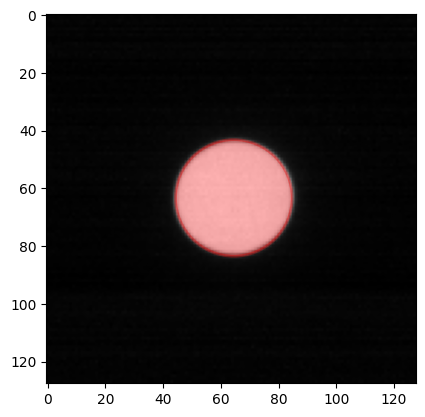

quantem Dataset named 'MOSS-6'
  shape: (256, 256, 128, 128)
  dtype: float32
  device: cpu
  origin: [0. 0. 0. 0.]
  sampling: [1.051      1.051      0.49534808 0.49534808]
  units: ['A', 'A', 'mrad', 'mrad']
  signal units: 'arb. units'


In [7]:
probe_qy0, probe_qx0, probe_R = fit_probe_circle(dset.dp_mean.array, show=True)
dset.sampling[2] = PROBE_SEMIANGLE / probe_R
dset.sampling[3] = PROBE_SEMIANGLE / probe_R
dset.units[2:] = ["mrad", "mrad"]
probe_R = PROBE_SEMIANGLE / dset.sampling[2]
print(dset)

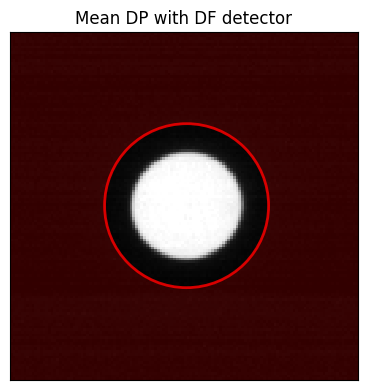

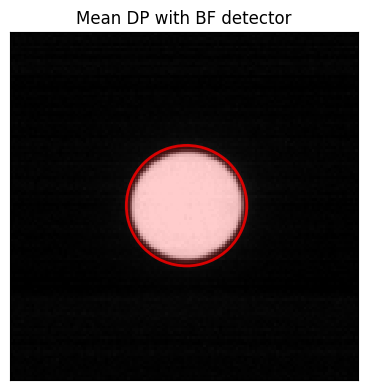

Dataset(shape=(256, 256), dtype=float32, name='BF')
  sampling: [1.051 1.051]
  units: ['A', 'A']
  signal units: 'arb. units'

In [8]:
dset.get_virtual_image(
    mode="annular",
    geometry=((probe_qy0, probe_qx0), (probe_R+10, probe_R*5)), 
    name="DF",
    show=True,
)

dset.get_virtual_image(
    mode="circle", 
    geometry=((probe_qy0, probe_qx0), probe_R+2), 
    name="BF",
    show=True,
)



(256, 256, 128, 128)


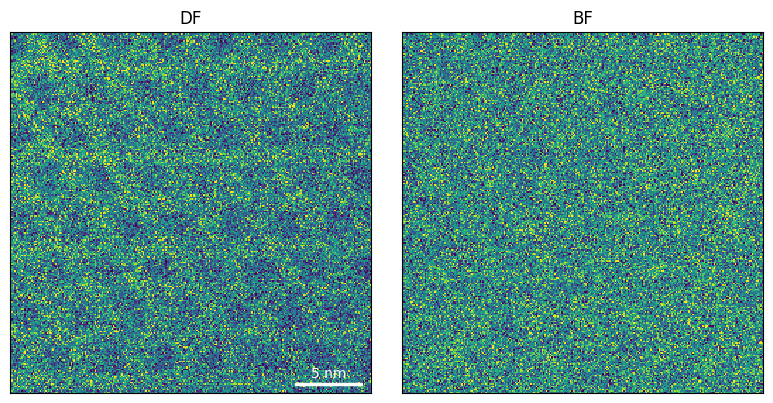

In [9]:
dset.show_virtual_images(cmap='viridis')
print(dset.shape)

Forcing best fit rotation to 90 degrees.
Forcing transpose of intensities to False.


Normalizing intensities: 100%|██████████| 65536/65536 [00:49<00:00, 1333.11probe position/s]


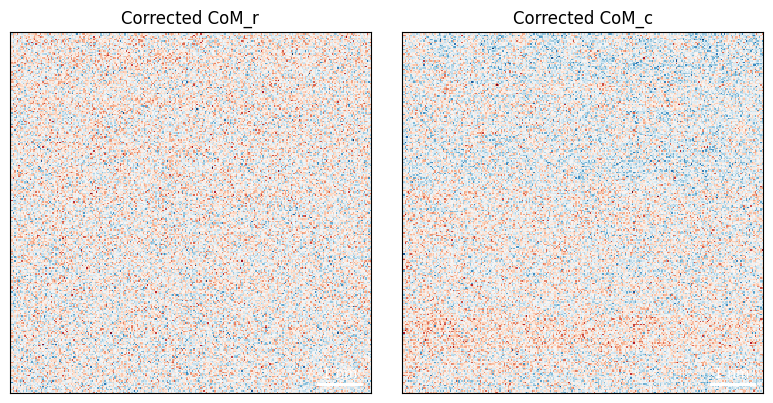

In [10]:
# dy, dx = 128, 128 
# sy, sx = 70, 64
# dset_crop = dset.crop(
#     ((sy,sy+dy), (sx,sx+dx)), axes=(0,1), modify_in_place=False,
# )
# dset_crop.regenerate_virtual_images()
# dset_crop.show_virtual_images(cmap='viridis')
# dset_crop.shape
# pdset = PtychographyDatasetRaster.from_dataset4dstem(dset_crop)

pdset = PtychographyDatasetRaster.from_dataset4dstem(dset)

pdset.preprocess(
    com_fit_function="constant",
    plot_rotation=True,
    plot_com=True,
    probe_energy=PROBE_ENERGY,
    force_com_rotation=90, 
    force_com_transpose=False,
)    

# pixelated

In [11]:
obj_model = ObjectPixelated.from_uniform(
    num_slices=NUM_SLICES, 
    slice_thicknesses=SLICE_THICKNESS,
    obj_type='pure_phase',
)

probe_params = {
    "energy" : PROBE_ENERGY,
    "defocus" : PROBE_DEFOCUS,
    "semiangle_cutoff" : PROBE_SEMIANGLE, 
}

probe_model = ProbePixelated.from_params(
    num_probes=NUM_PROBES,
    probe_params=probe_params,
)

detector_model = DetectorPixelated() 


ptycho_pix = Ptychography.from_models(
    dset=pdset,
    obj_model=obj_model,
    probe_model=probe_model,
    detector_model=detector_model,
    device='cpu',
)

ptycho_pix.preprocess( 
    obj_padding_px=(32,32),
    batch_size=128,
)

Epoch 20/20, Loss: 3.881e+04: 100%|██████████| 20/20 [02:17<00:00,  6.88s/it]


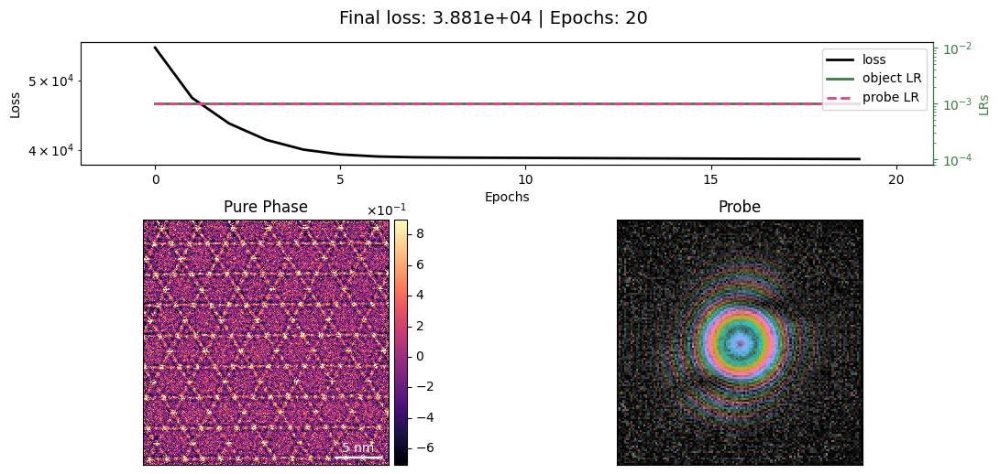

GPU memory allocated: 8.17 GB


In [12]:
opt_params = { # except type, all args are passed to the optimizer (of type type)
        "object": {
            "type": "adam", 
            "lr": 1e-3, 
        },
        "probe": {
            "type": "adam", 
            "lr": 1e-3, 
        },
        # "dataset": { ### for optimizing over descan shifts and probe positions
        #     "type": "adam",
        #     "lr": 1e-4,
        # }
}

scheduler_params = {
    "object": { ## scheduler kwargs are passed to the scheduler (of type type)
        "type": "plateau", ## i like plateau for many cases
    },
    "probe": {
        "type": "plateau",
        # "threshold": 1e-2, # e.g. plateau kwargs 
        # "patience": 100,
        # "cooldown": 100,
    },
    # "dataset": { 
    #     "type": "exp",  ## exp is also frequently used 
    #     "factor": 0.1,
    # }
}

constraints = {
    "object": {
        "tv_weight_yx": 0, ## these are mostly the defaults 
        "tv_weight_z": 0.,
        "fix_potential_baseline": False,
        "identical_slices": True, ## default for this is False 
        "apply_fov_mask": False,
    },
    "probe": {
        "center_probe": False,
        "orthogonalize_probe": True,
    },
    "dataset":{
        "descan_tv_weight": 0,
        "descan_shifts_constant": False, 
    }
}


# ptycho.remove_optimizer("probe")
ptycho_pix.reconstruct(
    num_iter=20,
    reset=True,
    autograd=True, 
    device='gpu',
    constraints=constraints, 
    optimizer_params=opt_params,
    scheduler_params=scheduler_params,
    batch_size=128,
).visualize()

print(f"GPU memory allocated: {torch.cuda.memory_allocated() / 1024**3:.2f} GB")


# DIP

In [13]:
probe_model_dummy = ProbePixelated.from_params(
    num_probes=NUM_PROBES,
    probe_params=probe_params,
)

obj_model_dummy = ObjectPixelated.from_uniform(
    num_slices=NUM_SLICES, 
    slice_thicknesses=SLICE_THICKNESS, 
    obj_type='pure_phase',
)

detector_model = DetectorPixelated() 

ptycho_dummy = Ptychography.from_models(
    dset=pdset,
    obj_model=obj_model_dummy,
    probe_model=probe_model_dummy,
    detector_model=detector_model,
    device='cpu',
)

ptycho_dummy.preprocess( 
    obj_padding_px=(32,32),
    batch_size=128,
)

Epoch 150/150, Loss: 1.044e-03, : 100%|██████████| 150/150 [00:07<00:00, 20.62it/s]
/home/amccray/code/quantem/src/quantem/core/visualization/visualization.py:547: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


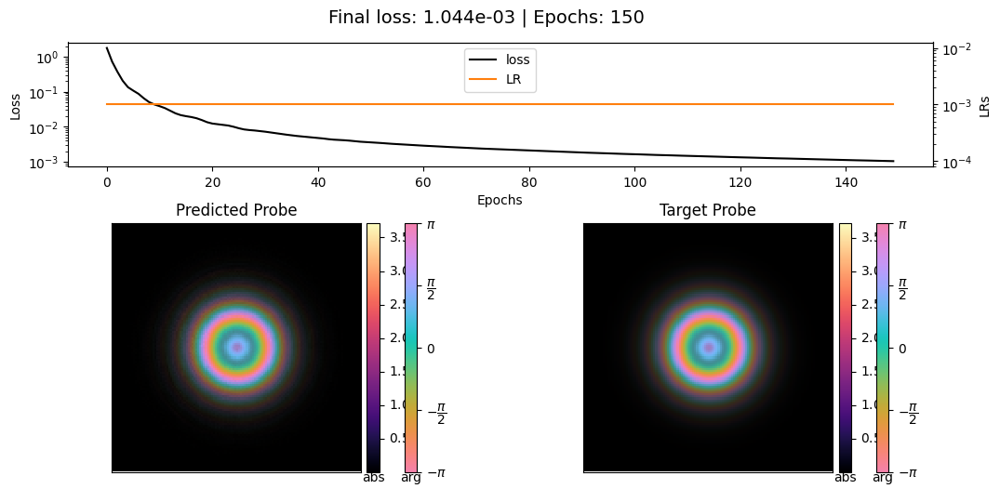

In [14]:
from quantem.core.ml.cnn3d import CNN3d 
from quantem.core.ml.cnn2d import CNN2d 
from quantem.diffractive_imaging.probe_models import ProbeDIP
import torch 

obj_dip = CNN2d(
    in_channels = NUM_SLICES, 
    start_filters = 16,
    num_layers = 3,
    use_skip_connections = True,
    dtype = torch.float32, # dtype float32 for pure_phase or potential, complex64 for complex
    use_batchnorm=True,
    final_activation = "identity", 
)

obj_model_dip = ObjectDIP.from_model(
    model = obj_dip, 
    model_input = ptycho_pix.obj_model.obj.angle(), 
    num_slices=NUM_SLICES,
    slice_thicknesses=SLICE_THICKNESS,
    obj_type='pure_phase',
    device=config.get("device"), 
    rng=42, 
)


probe_dip = CNN2d(
    in_channels=ptycho_pix.num_probes,
    start_filters=32,
    num_layers=3,
    use_skip_connections=True,
    dtype = torch.complex64,
    use_batchnorm=True,
)

probe_model_dip = ProbeDIP.from_model(
    model=probe_dip,
    model_input=ptycho_dummy.probe_model.probe,
    roi_shape=ptycho_dummy.probe_model.roi_shape,
    num_probes=ptycho_dummy.num_probes,
    device=config.get("device"),
    probe_params=probe_params,
)


### pretraining the obj model isn't necessary for this dataset 
# obj_model_dip.pretrain(
#     reset=True,
#     num_epochs=50,
#     optimizer_params={
#         "type": torch.optim.Adam,
#         "lr": 1e-3,
#     },
#     scheduler_params={
#         "type": "plateau",
#         "factor": 0.5,
#     },
#     apply_constraints=False,
#     pretrain_target=ptycho_pix.obj_model.obj.angle(),
# )

probe_model_dip.pretrain(
    reset=True,
    num_epochs=150,
    optimizer_params={
        "type": torch.optim.Adam,
        "lr": 1e-3,
    },
    scheduler_params={
        "type": "plateau",
        "factor": 0.5,
    },
    apply_constraints=False,
)

ptycho_dip = Ptychography.from_models(
    dset=pdset,
    obj_model=obj_model_dip,
    probe_model=probe_model_dip,
    detector_model=detector_model,
    device="gpu",
)

ptycho_dip.preprocess(
    obj_padding_px=(32, 32),
)

Epoch 25/25, Loss: 3.864e+04: 100%|██████████| 25/25 [19:06<00:00, 45.84s/it]


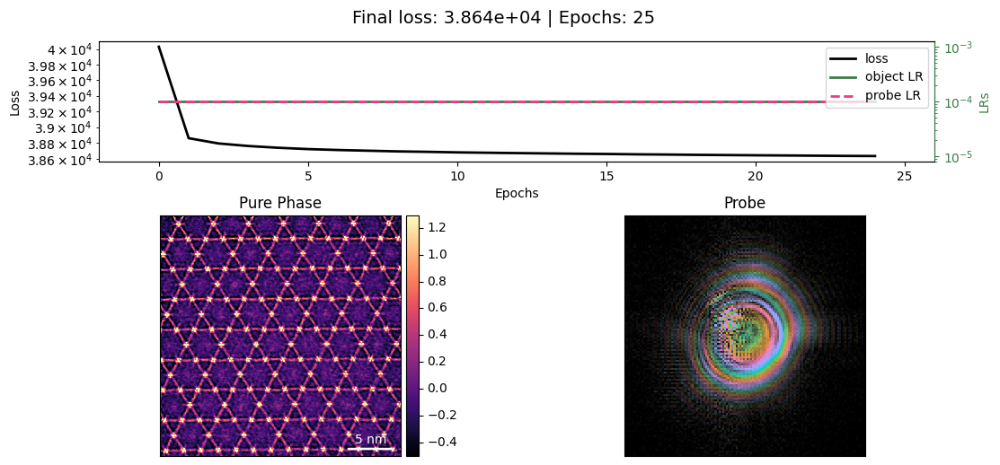

In [15]:
opt_params = {  
    "object": {
        "type": "adam", 
        "lr": 1e-4, 
    },
    "probe": {
        "type": torch.optim.Adam,
        "lr": 1e-4, 
    },
}

scheduler_params = {
    "object": {
        "type": "plateau",
    },
    "probe": {
        "type": "plateau",
    },
}
constraints = {
    "object": {
        "identical_slices": True,
    },
}

ptycho_dip.reconstruct(
    num_iter=25,
    reset=True,
    optimizer_params=opt_params,
    scheduler_params=scheduler_params,
    constraints=constraints,
    batch_size=128,
    store_iterations=True,
    store_iterations_every=1, 
).visualize()

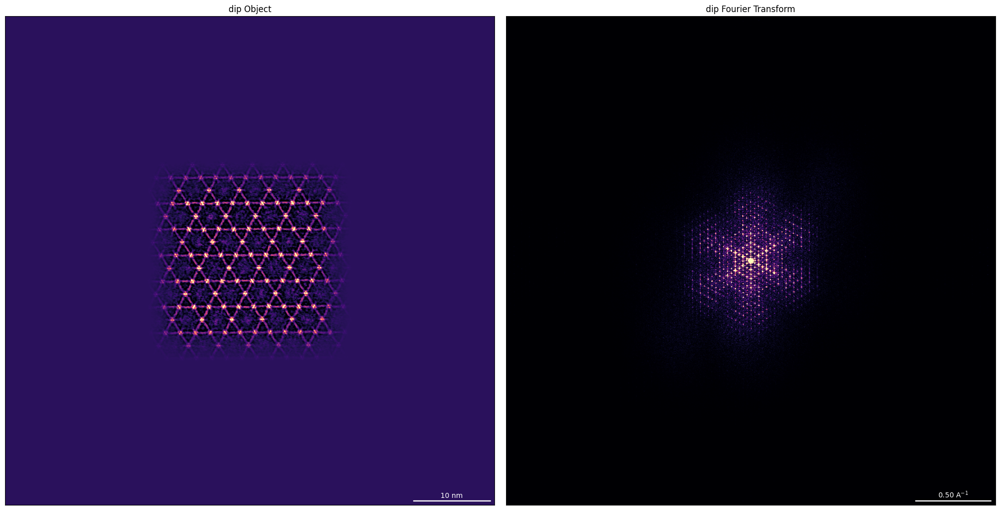

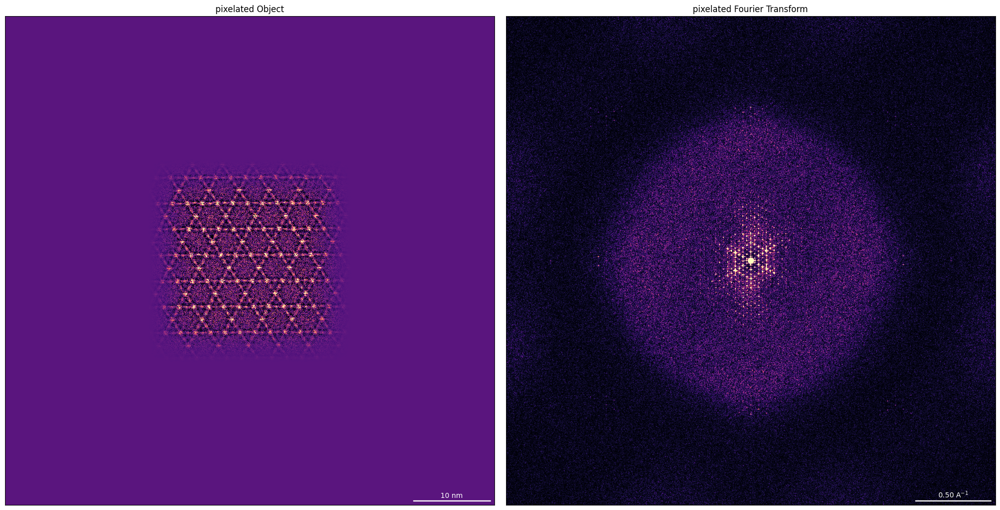

In [16]:
alpha = 0.5
pad = (2048 - ptycho_dip.obj_cropped.shape[1]) // 2 # 500
dip_ff1 = ptycho_dip.show_obj_fft(tukey_alpha=alpha, cmap='magma', pad = pad, upper_quantile=0.999, lower_quantile=0.01, title='dip', axsize=(10,10), show_obj=True, return_fft=True)
pix_ff1 = ptycho_pix.show_obj_fft(tukey_alpha=alpha, cmap='magma', pad = pad, upper_quantile=0.999, lower_quantile=0.01, title='pixelated', axsize=(10,10), show_obj=True, return_fft=True)


(<Figure size 1000x1000 with 1 Axes>, <Axes: >)

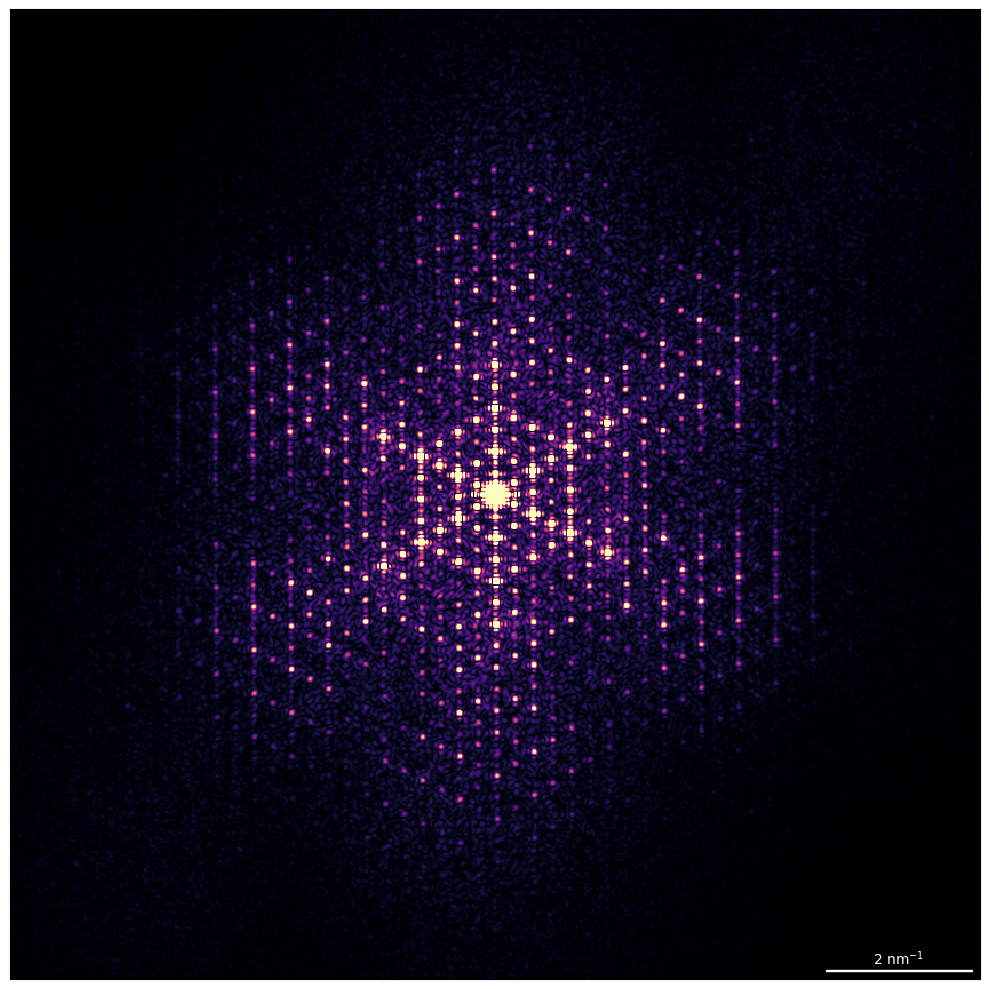

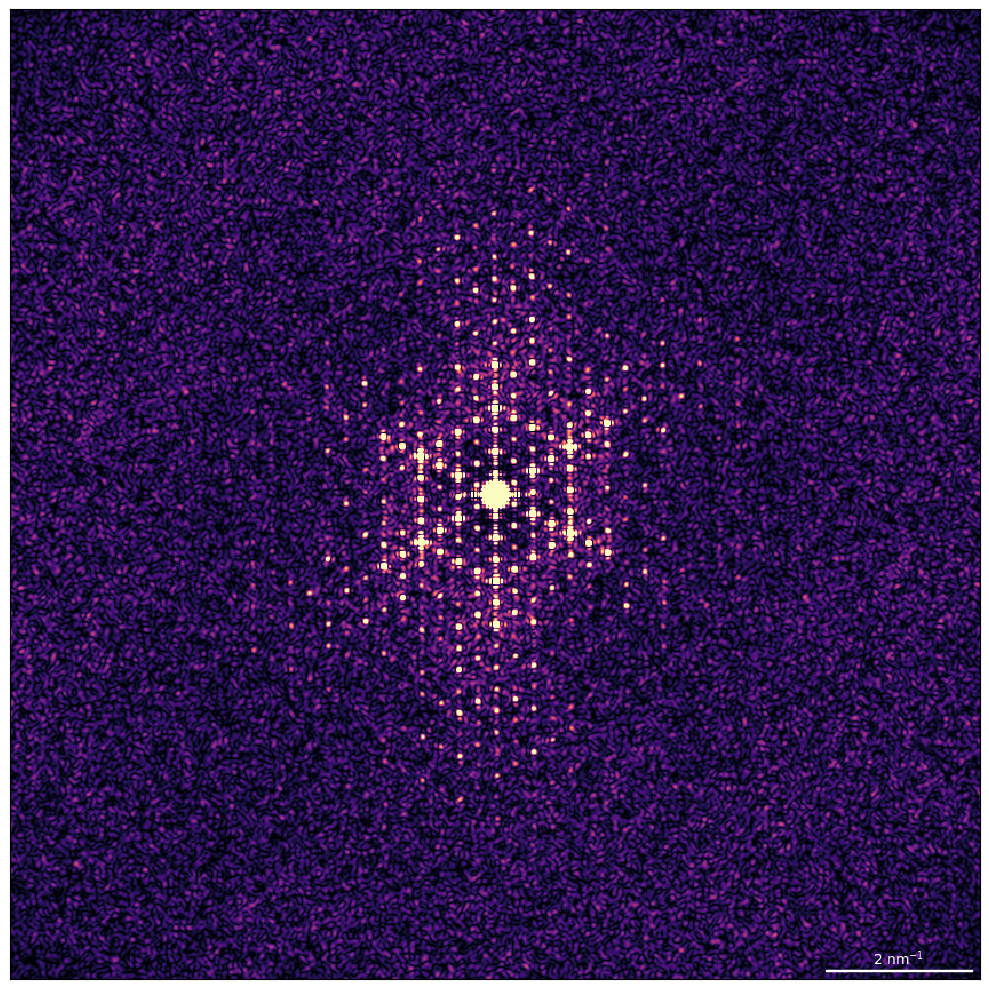

In [17]:
c = 600
fft_sampling = 1 / (ptycho_dip.sampling[0] * dip_ff1.shape[0])
show_2d(
    np.abs(dip_ff1[c:-c,c:-c]),
    cmap='magma',
    axsize=(10,10),
    upper_quantile=0.995,
    scalebar=[{"sampling": fft_sampling*10, "units": r"$\mathrm{nm^{-1}}$"}],
)
show_2d(
    np.abs(pix_ff1[c:-c,c:-c]),
    cmap='magma',
    axsize=(10,10),
    upper_quantile=0.995,
    scalebar=[{"sampling": fft_sampling*10, "units": r"$\mathrm{nm^{-1}}$"}],
)


In [18]:
# ptycho_dip.save(
#     "/path/to/save/ptycho_dip.zip",
# )
# ptycho_pix.save(
#     "/path/to/save/ptycho_pix.zip",
# )

# ptycho_dip = Ptychography.from_file(
#     "/path/to/load/ptycho_dip.zip",
# )
# ptycho_pix = Ptychography.from_file(
#     "/path/to/load/ptycho_pix.zip",
# )
